## Import modules

In [1]:
import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import celltypist

/nfs/team205/kk18/miniconda3/envs/vitro/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import session_info
session_info.show()

In [3]:
# import own function
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120)

# Read in data

In [5]:
adata = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_July2024.h5ad')
adata

AnnData object with n_obs × n_vars = 121452 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', 'leiden_scVI_0.1', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.5', 'leiden_scVI_0.7', 'leiden_scVI_1'
    var: 'gene_name', 'feature_type', 'ambient_expression-0', 'ambient_expression-1', 'ambient_expression-10', 'ambient_expression-11', 'ambient_expression-12', 'ambient_expression-13', 'ambient_expression-14', 'ambient_expression-2', 'ambient_

In [6]:
adata.var['gene_id'] = adata.var_names.copy()
adata.var.set_index('gene_name',inplace=True)
adata.var_names = adata.var_names.astype('str')
adata.var_names_make_unique()

# Filter and log-normalise

In [7]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

filtered out 3535 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:01)


In [8]:
print(adata.shape)
adata.X.data[:5]

(121452, 33066)


array([0.0534004 , 0.10409318, 0.19836526, 0.0534004 , 0.15233971],
      dtype=float32)

# CellTypist prediction

- this is to identify major cardiac cells and to annotate

In [9]:
# coarse-grained
predictions = celltypist.annotate(adata, 
                                  model = '/nfs/team205/kk18/notebooks/Foetal/VisiumHD/mpp0p3/celltypist_models/from_foetal_portal/foetal_heart_coarse.pkl', 
                                  majority_voting = False)

# add to anndata
adata = predictions.to_adata(insert_labels = True, insert_conf = True)
adata.obs.rename(columns={'predicted_labels':'celltypist_coarse',
                              'conf_score':'conf_score_coarse'
                             },inplace=True)
adata.obs.head()

🔬 Input data has 121452 cells and 33066 genes
🔗 Matching reference genes in the model
🧬 29480 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


,latent_RT_efficiency,latent_cell_probability,latent_scale,sangerID,combinedID,donor,donor_type,region,region_finest,age,...,HB_score,batch_key,leiden_scVI_0.1,leiden_scVI_0.2,leiden_scVI_0.3,leiden_scVI_0.5,leiden_scVI_0.7,leiden_scVI_1,celltypist_coarse,conf_score_coarse
barcode,,,,,,,,,,,,,,,,,,,,,
BHF_F_Hea13188320_BHF_F_Hea13187622_CATAATGTCGAGGAGT-1,11.273935,0.999996,22522.093750,BHF_F_Hea13188320,BHF_F_Hea13188320_BHF_F_Hea13187622,Hst42,na,Great vessels,Great vessels,PCW-14w,...,0.149951,Hst42_Nuclei_Multiome-v1,0,4,3,13,17,15,Mesenchymal,0.995065
BHF_F_Hea13188320_BHF_F_Hea13187622_GCAGCTATCCACCTTA-1,6.264781,0.999999,10376.255859,BHF_F_Hea13188320,BHF_F_Hea13188320_BHF_F_Hea13187622,Hst42,na,Great vessels,Great vessels,PCW-14w,...,-0.045871,Hst42_Nuclei_Multiome-v1,4,7,9,10,11,11,Endothelium,0.999290
BHF_F_Hea13188320_BHF_F_Hea13187622_AAGCCTTAGCCTCTGT-1,5.800651,0.999990,7330.404785,BHF_F_Hea13188320,BHF_F_Hea13188320_BHF_F_Hea13187622,Hst42,na,Great vessels,Great vessels,PCW-14w,...,-0.157181,Hst42_Nuclei_Multiome-v1,0,4,3,11,12,13,Mesenchymal,1.000000
BHF_F_Hea13188320_BHF_F_Hea13187622_CCTACTTCAATAACCT-1,5.540628,1.000000,11676.054688,BHF_F_Hea13188320,BHF_F_Hea13188320_BHF_F_Hea13187622,Hst42,na,Great vessels,Great vessels,PCW-14w,...,-0.217034,Hst42_Nuclei_Multiome-v1,0,4,3,11,12,13,Mesenchymal,0.999949
BHF_F_Hea13188320_BHF_F_Hea13187622_CTTGCTCAGCCAGGTC-1,4.964027,0.999998,9321.906250,BHF_F_Hea13188320,BHF_F_Hea13188320_BHF_F_Hea13187622,Hst42,na,Great vessels,Great vessels,PCW-14w,...,-0.145937,Hst42_Nuclei_Multiome-v1,0,4,3,11,12,13,Mesenchymal,0.999823


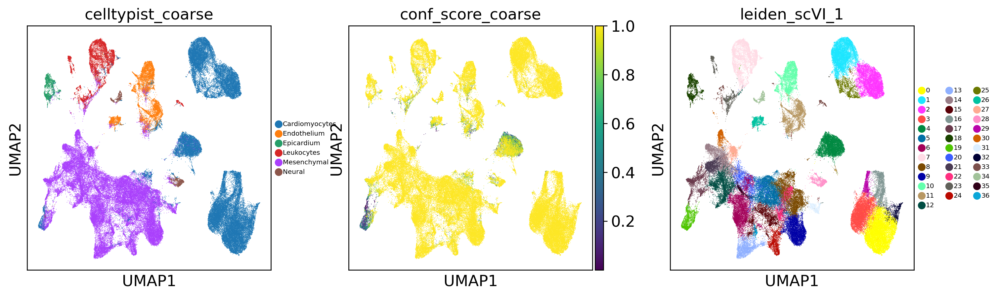

In [10]:
sc.pl.umap(adata, color=['celltypist_coarse','conf_score_coarse','leiden_scVI_1'], size=1, legend_fontsize=6, wspace=0.2)

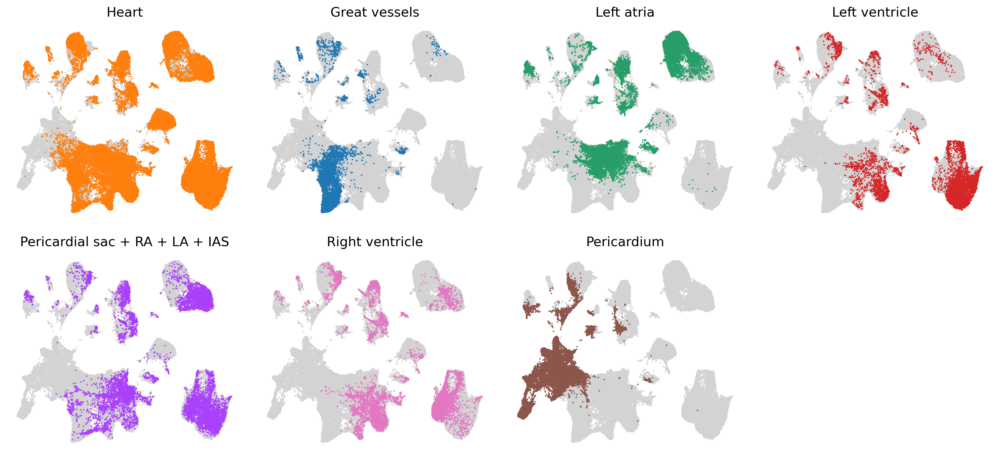

In [25]:
# umap per celltype to highlight
group_col = 'region'
groups_to_plot = ['Heart',
                  'Great vessels', 
                 'Left atria',
                 'Left ventricle',
                 'Pericardial sac + RA + LA + IAS',
                 'Right ventricle',
                  'Pericardium',
                 ]

plt.rcParams['axes.grid'] = False
fig,axs=plt.subplots(nrows=2,ncols=4,figsize=(15,7))
# Flatten the axs array for easier iteration in case of multiple rows and columns
axs_flat = axs.flatten()

for i,grp in enumerate(groups_to_plot):
    sc.pl.umap(adata, color=[group_col], groups=grp, 
               size=10, frameon=False,
               show=False, ax=axs_flat[i], legend_loc=None, legend_fontsize=5,
               title=grp
              )
# Turn off any remaining subplots
for j in range(len(groups_to_plot), len(axs_flat)):
    fig.delaxes(axs_flat[j])

# fig.suptitle('Main Title for the Figure')
fig.tight_layout()

"Pericardium" region is not represented in "Heart" and other region samples. In addition, "Pericardium" sample is coming from one donor <br>
"Pericardium" sample will be in the dataset but will be removed at downstream analysis (e.g. Milo)

# Select cells to remove

In [27]:
# mean condidence score
group_col = 'leiden_scVI_1'
conf_score_col = 'conf_score_coarse'
df = adata.obs[[group_col,conf_score_col]].groupby(group_col).mean()
df.sort_values(conf_score_col,ascending=False)

,conf_score_coarse
leiden_scVI_1,
3,0.999958
0,0.999941
2,0.999940
1,0.999903
32,0.999680
16,0.999546
6,0.999266
14,0.999018
20,0.998933


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_scVI_1']`
categories: 0, 1, 2, etc.
var_group_labels: vCM, aCM, FB, etc.


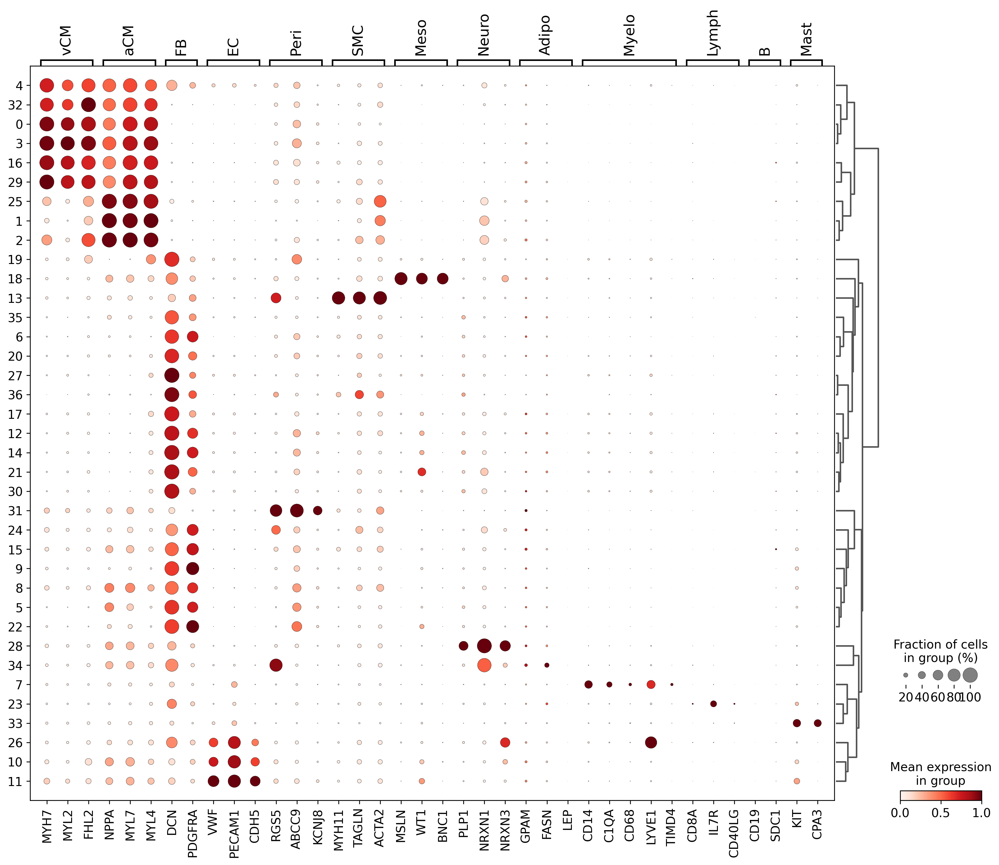

In [28]:
# cell type marker expression
markers = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby=group_col)
sc.pl.dotplot(adata,
              markers, 
              groupby=group_col,
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              # swap_axes=True,
             )

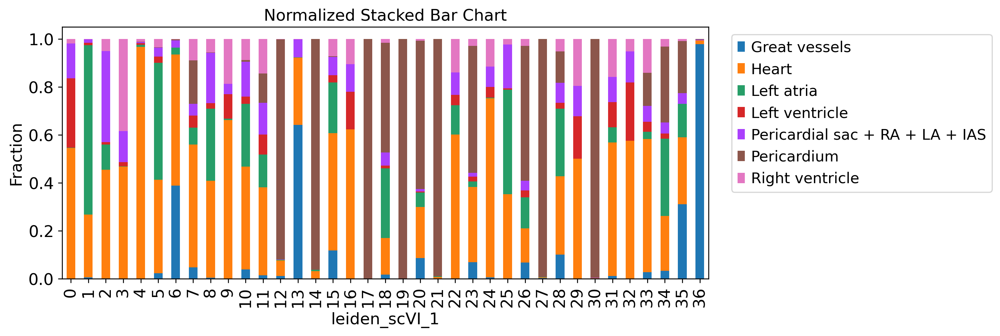

In [41]:
# sangerID proportion
crosstab=pd.crosstab(adata.obs[group_col],adata.obs["region"])
# Normalize each row to sum to 1 (i.e., to get fractions)
crosstab_normalized = crosstab.div(crosstab.sum(axis=1), axis=0)

# Plotting the stacked bar chart
ax = crosstab_normalized.plot(kind='bar',stacked=True,figsize=(10, 4),legend=False)

# Adding labels and title
plt.ylabel('Fraction')
plt.title('Normalized Stacked Bar Chart')
plt.legend(bbox_to_anchor=(0.95, 0.5, 0.5, 0.5))

# Show the plot
plt.show()

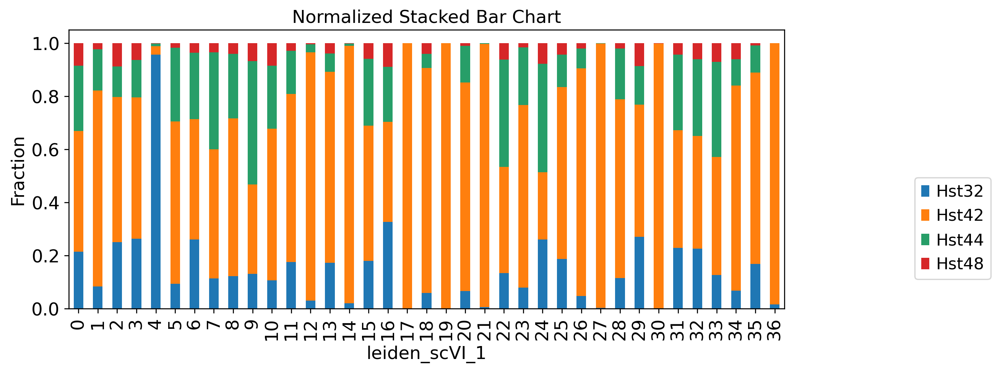

In [29]:
# donor proportion
crosstab=pd.crosstab(adata.obs[group_col],adata.obs["donor"])
# Normalize each row to sum to 1 (i.e., to get fractions)
crosstab_normalized = crosstab.div(crosstab.sum(axis=1), axis=0)

# Plotting the stacked bar chart
ax = crosstab_normalized.plot(kind='bar',stacked=True,figsize=(10, 4),legend=False)

# Adding labels and title
plt.ylabel('Fraction')
plt.title('Normalized Stacked Bar Chart')
plt.legend(bbox_to_anchor=(0.8, 0., 0.5, 0.5))

# Show the plot
plt.show()

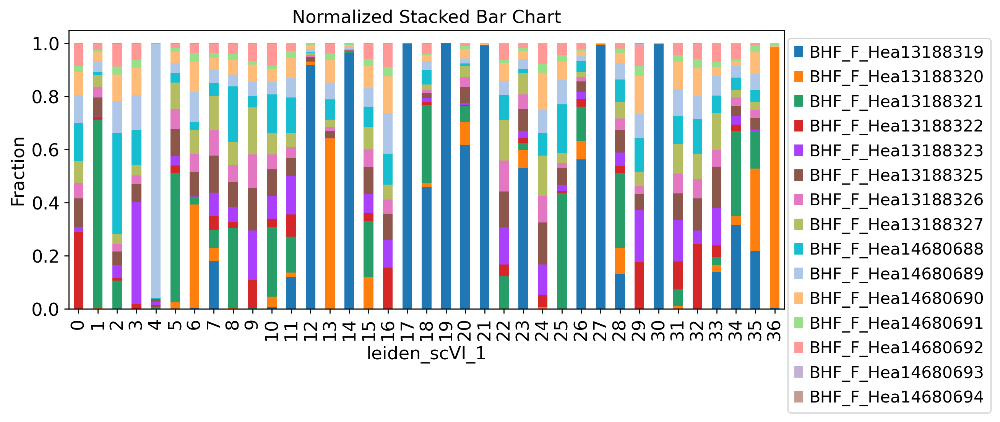

In [30]:
# sangerID proportion
crosstab=pd.crosstab(adata.obs[group_col],adata.obs["sangerID"])
# Normalize each row to sum to 1 (i.e., to get fractions)
crosstab_normalized = crosstab.div(crosstab.sum(axis=1), axis=0)

# Plotting the stacked bar chart
ax = crosstab_normalized.plot(kind='bar',stacked=True,figsize=(10, 4),legend=False)

# Adding labels and title
plt.ylabel('Fraction')
plt.title('Normalized Stacked Bar Chart')
plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5))

# Show the plot
plt.show()

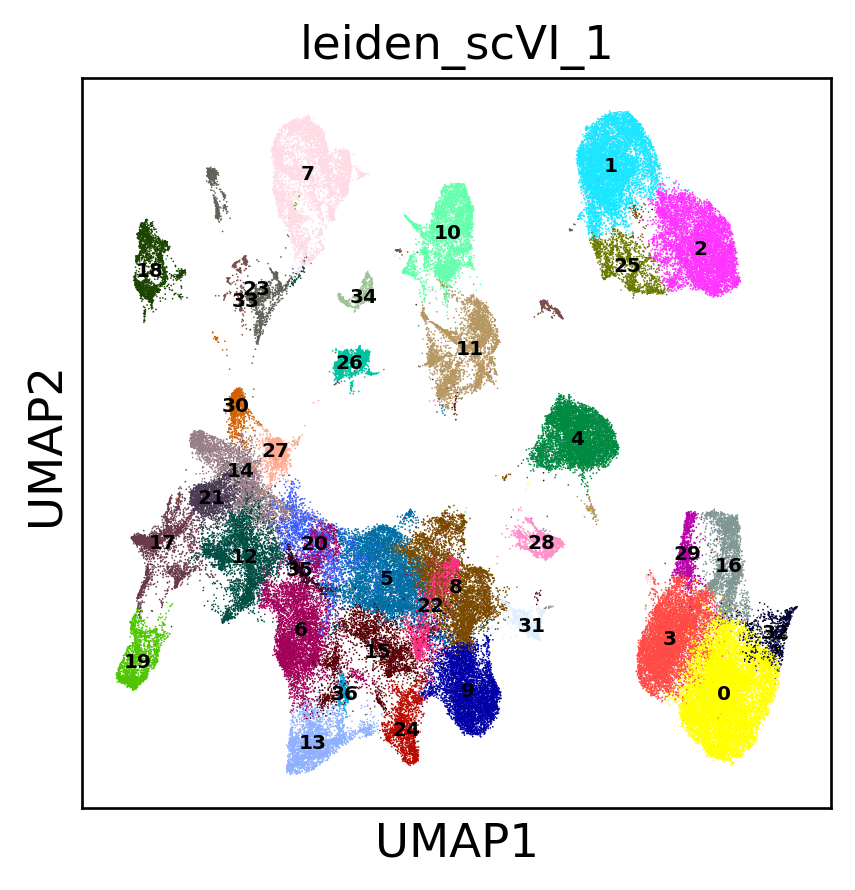

In [15]:
sc.settings.set_figure_params(dpi=120)
sc.pl.umap(adata, color=['leiden_scVI_1'], size=1, legend_fontsize=6, wspace=0.2, legend_loc='on data')

* remove cells which has confidence score lower than 0.6 (likely non-cardiac cells)
* remove clusters, which are composed of mostly (>90%) only one sangerID: non-reproducible clusters
* keep clusters from Pericardium sample (since only one sample)

... storing 'cells_to_remove' as categorical


single_sample_clusters: ['4', '12', '14', '17', '19', '21', '27', '30', '36']
pericardium_clusters: ['12', '14', '17', '19', '21', '27', '30']
single_butnot_peri_clusters: ['36', '4']


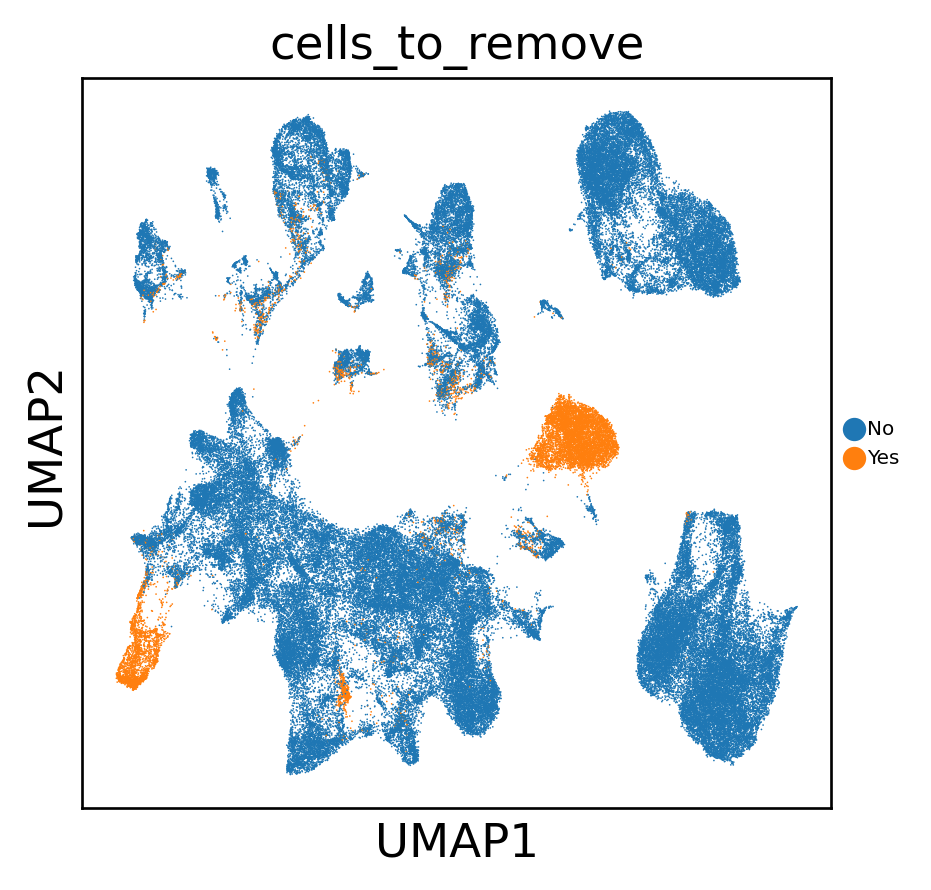

In [42]:
conf_score_thresh = 0.6

# identify single-sample clusters
crosstab=pd.crosstab(adata.obs[group_col],adata.obs["sangerID"])
crosstab_normalized = crosstab.div(crosstab.sum(axis=1), axis=0)
res = crosstab_normalized.max(axis=1)
single_sample_clusters = list(res.index[res>0.9])
print(f'single_sample_clusters: {single_sample_clusters}')

# identify pericardium clusters
crosstab=pd.crosstab(adata.obs[group_col],adata.obs["region"])
crosstab_normalized = crosstab.div(crosstab.sum(axis=1), axis=0)
res = crosstab_normalized['Pericardium']
pericardium_clusters = list(res.index[res>0.9])
print(f'pericardium_clusters: {pericardium_clusters}')

single_butnot_peri_clusters = list(set(single_sample_clusters)-set(pericardium_clusters))
print(f'single_butnot_peri_clusters: {single_butnot_peri_clusters}')

mask1 = adata.obs[group_col].isin(['4','19'])
mask2 = adata.obs[conf_score_col] < conf_score_thresh
mask3 = adata.obs[group_col].isin(single_butnot_peri_clusters)
adata.obs['cells_to_remove'] = 'No'
adata.obs.loc[adata.obs_names[mask1|mask2|mask3],'cells_to_remove'] = 'Yes'
sc.pl.umap(adata, color=['cells_to_remove'], size=1, legend_fontsize=6, wspace=0.2)

# Remove from the raw data

In [43]:
adata_raw = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_July2024.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 121452 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', 'leiden_scVI_0.1', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.5', 'leiden_scVI_0.7', 'leiden_scVI_1'
    var: 'gene_name', 'feature_type', 'ambient_expression-0', 'ambient_expression-1', 'ambient_expression-10', 'ambient_expression-11', 'ambient_expression-12', 'ambient_expression-13', 'ambient_expression-14', 'ambient_expression-2', 'ambient_

In [44]:
adata_raw.var['gene_id'] = adata_raw.var_names.copy()
adata_raw.var.set_index('gene_name',inplace=True)
adata_raw.var_names = adata_raw.var_names.astype('str')
adata_raw.var_names_make_unique()

In [45]:
# add prediction results, etc
adata_raw.obs[['celltypist_coarse','conf_score_coarse','cells_to_remove']] = adata[adata_raw.obs_names].obs[['celltypist_coarse','conf_score_coarse','cells_to_remove']].copy()

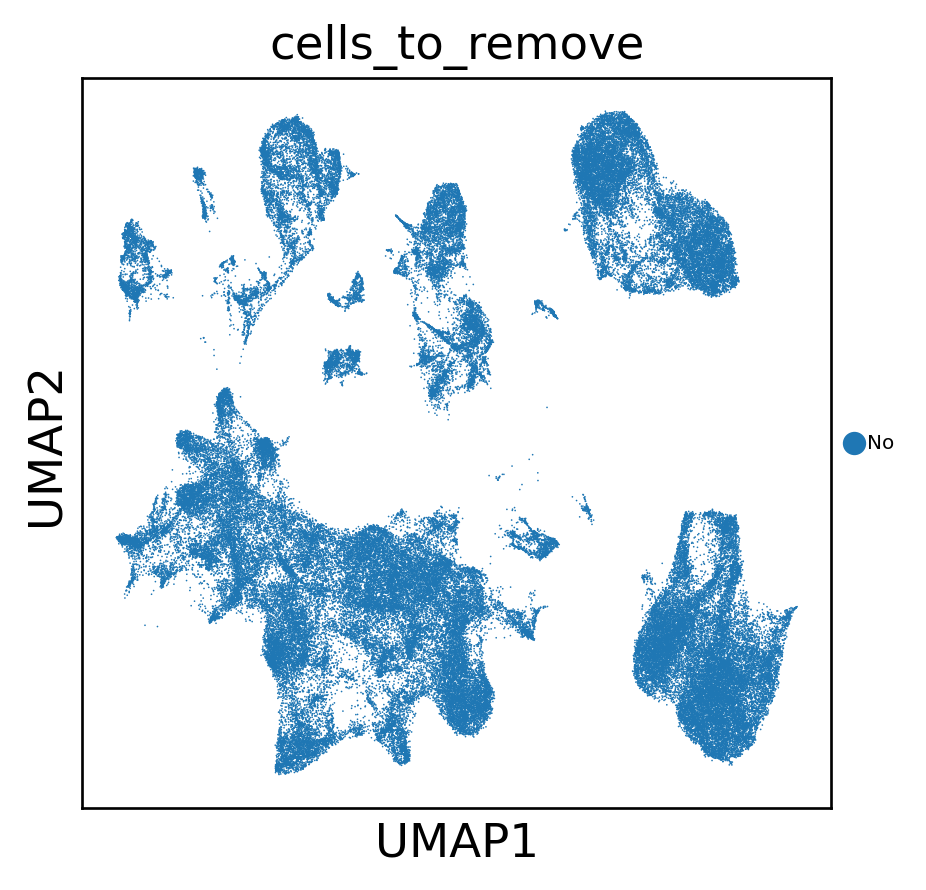

In [46]:
# remove
adata_raw = adata_raw[adata_raw.obs['cells_to_remove']=='No']
sc.pl.umap(adata_raw, color=['cells_to_remove'], size=1, legend_fontsize=6, wspace=0.2)

In [47]:
# save
adata_raw.write('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.h5ad')

# recalculate UMAP, etc

In [48]:
%%time
sc.pp.neighbors(adata_raw, use_rep="X_scVI")
sc.tl.umap(adata_raw, min_dist=0.2)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:11)
CPU times: user 2min 46s, sys: 733 ms, total: 2min 47s
Wall time: 2min 49s


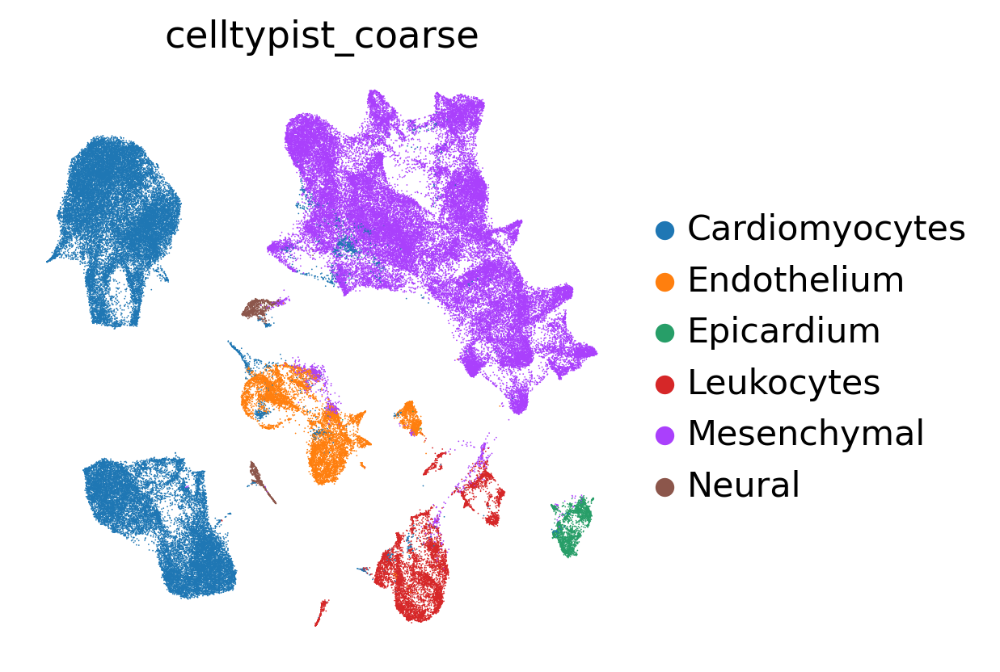

In [49]:
sc.pl.umap(adata_raw, color=['celltypist_coarse'], frameon=False)

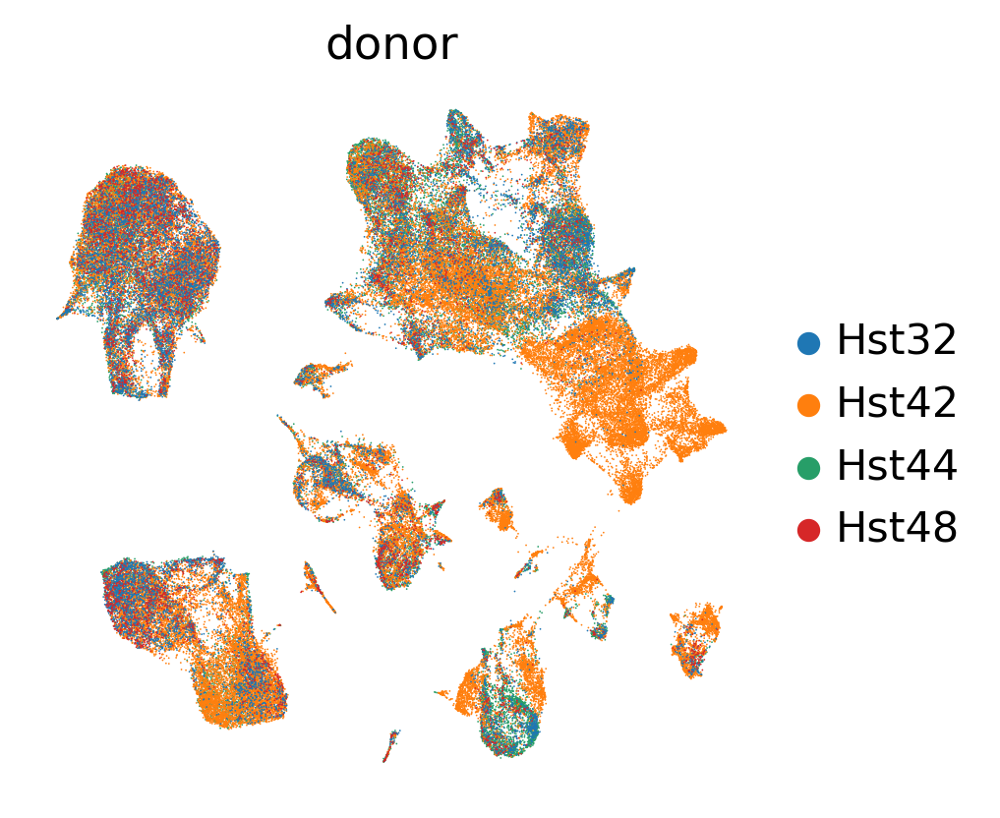

In [50]:
sc.pl.umap(adata_raw, color=['donor'], frameon=False)

In [51]:
# save
adata_raw.write('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.h5ad')

# Modify obs

- To prepare for the integration with euploid data

In [53]:
# age
adata_raw.obs.replace({'age':{
    'PCW-11w':'11W0D',
    'PCW-13w':'13W0D',
    'PCW-14w':'14W0D',
}},inplace=True)

adata_raw.obs['week'] = [x.split('0D')[0] for x in adata_raw.obs['age']]
adata_raw.obs['trimester'] = adata_raw.obs['age'].astype('str').copy()
adata_raw.obs.replace({'trimester':{
    '11W0D':'firsttrimester',
    '13W0D':'secondtrimester',
    '14W0D':'secondtrimester',
}},inplace=True)

In [54]:
adata_raw.obs.drop(['gender'],axis=1,inplace=True)

In [55]:
# sex
adata_raw.obs['sex'] = adata_raw.obs['donor'].astype('str').copy()
adata_raw.obs.replace({'sex':{
    'Hst32':'female',
    'Hst42':'male',
    'Hst44':'male',
    'Hst48':'male'
}},inplace=True)

In [56]:
# save
adata_raw.write('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.h5ad')
adata_raw

... storing 'week' as categorical
... storing 'trimester' as categorical
... storing 'sex' as categorical


AnnData object with n_obs × n_vars = 110693 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', 'leiden_scVI_0.1', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.5', 'leiden_scVI_0.7', 'leiden_scVI_1', 'celltypist_coarse', 'conf_score_coarse', 'cells_to_remove', 'week', 'trimester', 'sex'
    var: 'feature_type', 'ambient_expression-0', 'ambient_expression-1', 'ambient_expression-10', 'ambient_expression-11', 'ambient_expression-12', 'ambient_expressi

# CellTypist prediction for fine-grained labels (run per coarse-grained)

In [5]:
adata_raw = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 110693 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', 'leiden_scVI_0.1', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.5', 'leiden_scVI_0.7', 'leiden_scVI_1', 'celltypist_coarse', 'conf_score_coarse', 'cells_to_remove', 'week', 'trimester', 'sex', 'celltypist_fine', 'conf_score_fine'
    var: 'feature_type', 'ambient_expression-0', 'ambient_expression-1', 'ambient_expression-10', 'ambient_expression-11', 'amb

In [6]:
adata = adata_raw.copy()
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.X.data[:5]

filtered out 3663 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)


array([0.0534004 , 0.10409318, 0.19836526, 0.0534004 , 0.15233971],
      dtype=float32)

In [7]:
adata.obs['celltypist_coarse'].value_counts()

Mesenchymal       49009
Cardiomyocytes    42792
Endothelium        8089
Leukocytes         7262
Epicardium         2071
Neural             1470
Name: celltypist_coarse, dtype: int64

In [8]:
# predict per coarse_grained cell type
for celltype in adata.obs['celltypist_coarse'].unique():
    print(celltype)
    # subset adata
    adata_sub = adata[adata.obs['celltypist_coarse']==celltype]
    # drop all the obs columns
    adata_sub.obs.drop(columns=adata_sub.obs.columns,inplace=True)
    # predict
    predictions = celltypist.annotate(adata_sub, 
                                      model = f'/nfs/team205/kk18/notebooks/Foetal/Trisomy21/celltypist_models/coarse2fine_{celltype}.pkl', 
                                      majority_voting = False)

    # add to subsetted anndata
    adata_sub = predictions.to_adata(insert_labels = True, insert_conf = True)
    adata_sub.obs.rename(columns={'predicted_labels':'celltypist_fine',
                                  'conf_score':'conf_score_fine'
                                 },inplace=True)
    # add to the original anndata
    adata.obs.loc[adata_sub.obs_names,'celltypist_fine'] = list(adata_sub.obs['celltypist_fine'])
    adata.obs.loc[adata_sub.obs_names,'conf_score_fine'] = list(adata_sub.obs['conf_score_fine'])

Mesenchymal


🔬 Input data has 49009 cells and 32938 genes
🔗 Matching reference genes in the model
🧬 32502 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 8089 cells and 32938 genes
🔗 Matching reference genes in the model


Endothelium


🧬 31696 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 2071 cells and 32938 genes
🔗 Matching reference genes in the model


Epicardium


🧬 30529 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


Cardiomyocytes


🔬 Input data has 42792 cells and 32938 genes
🔗 Matching reference genes in the model
🧬 31533 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 1470 cells and 32938 genes
🔗 Matching reference genes in the model


Neural


🧬 29361 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 7262 cells and 32938 genes
🔗 Matching reference genes in the model


Leukocytes


🧬 31793 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [9]:
# add prediction results
adata_raw.obs[['celltypist_fine','conf_score_fine']] = adata[adata_raw.obs_names].obs[['celltypist_fine','conf_score_fine']].copy()

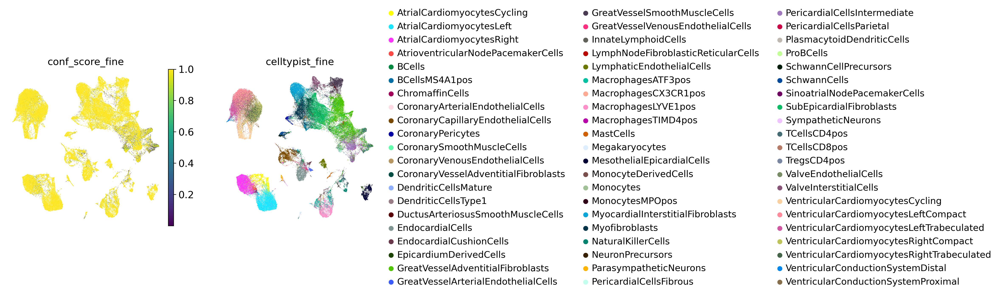

In [10]:
sc.pl.umap(adata_raw, color=['conf_score_fine','celltypist_fine'], frameon=False)

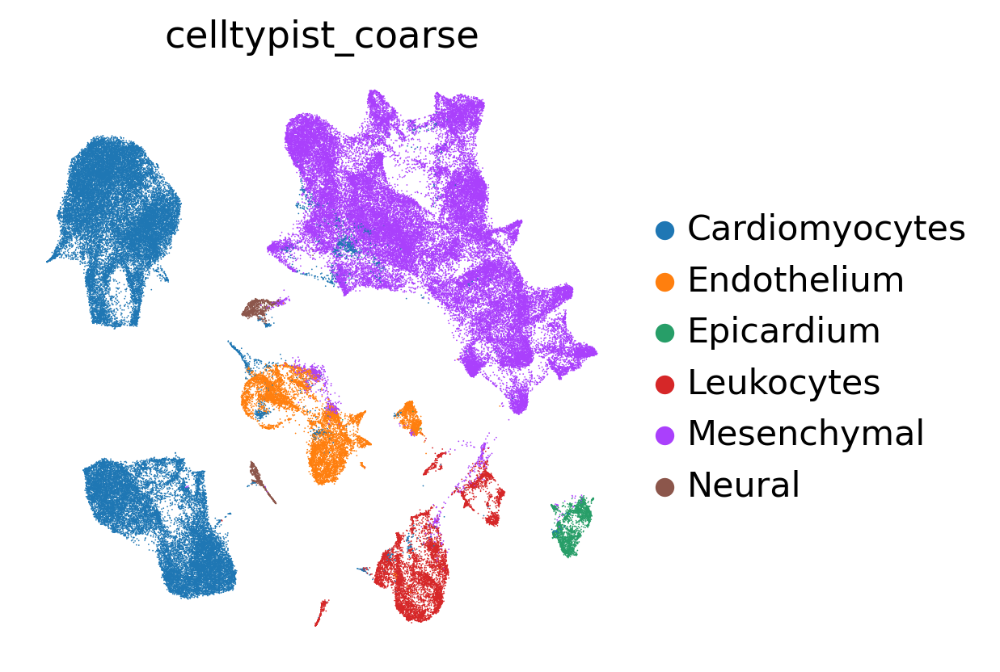

In [13]:
sc.pl.umap(adata_raw, color=['celltypist_coarse'], frameon=False)

In [11]:
# save
adata_raw.write('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 110693 × 36601
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'HB_score', 'batch_key', 'leiden_scVI_0.1', 'leiden_scVI_0.2', 'leiden_scVI_0.3', 'leiden_scVI_0.5', 'leiden_scVI_0.7', 'leiden_scVI_1', 'celltypist_coarse', 'conf_score_coarse', 'cells_to_remove', 'week', 'trimester', 'sex', 'celltypist_fine', 'conf_score_fine'
    var: 'feature_type', 'ambient_expression-0', 'ambient_expression-1', 'ambient_expression-10', 'ambient_expression-11', 'amb

In [12]:
# save .obs for later use
adata_raw.obs.to_csv('/nfs/team205/heart/anndata_objects/Foetal/trisomy21/T21Hearts_cleaned_July2024.obs.csv')